# Thông tin
1. **Họ Tên:** Huỳnh Trung Nghĩa    **MSSV:** 22520945
2. **Họ Tên:** Nguyễn Hùng Phát     **MSSV:** 22521074
3. **Đồ án:** Phát hiện việc đeo khẩu trang
4. **Ngày báo cáo:** 30/5/2024

# Import library

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

import seaborn as sns
import matplotlib.pyplot as plt


import os
import cv2
import numpy as np
from sklearn import svm


In [ ]:

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Preprocessing (tiền xử lí)

### Trích xuất đặc trưng HOG

In [ ]:
from skimage.feature import hog

def extract_hog_features(image):
    image = cv2.resize(image, (128,128))

    hog_features = []

    for channel in cv2.split(image):                  # Tách ảnh thành các kênh màu riêng biệt
        fd, hog_image = hog(channel, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(4,4),
                            visualize=True, transform_sqrt=True, block_norm="L2")
        hog_features.append(fd)

    combined_hog_features = np.hstack(hog_features)   # Kết hợp các đặc trưng HOG từ các kênh màu

    return combined_hog_features


### Gán nhãn dữ liệu

In [ ]:
def load_data_from_folder(folder,lable):
    images = []
    labels = []
    filenames = os.listdir(folder)

    for filename in filenames:
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)

        hog_features = extract_hog_features(img)

        images.append(hog_features)
        labels.append(lable)

    return np.array(images), np.array(labels), filenames

### Tải dữ liệu (Img)

In [ ]:
mask_images_folder = '/content/drive/MyDrive/CS231_CV/TGMT/dataset/mask/mask'
no_mask_images_folder = '/content/drive/MyDrive/CS231_CV/TGMT/dataset/no_mask/no_mask'

mask_images, mask_labels, mask_filenames = load_data_from_folder(mask_images_folder, 1)
no_mask_images, no_mask_labels, no_mask_filenames = load_data_from_folder(no_mask_images_folder, 0)

In [ ]:
no_mask_labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
mask_labels

array([1, 1, 1, ..., 1, 1, 1])

### Kiểm tra mẫu mỗi lớp

Class No Mask: 1484 samples
Class Mask: 1266 samples


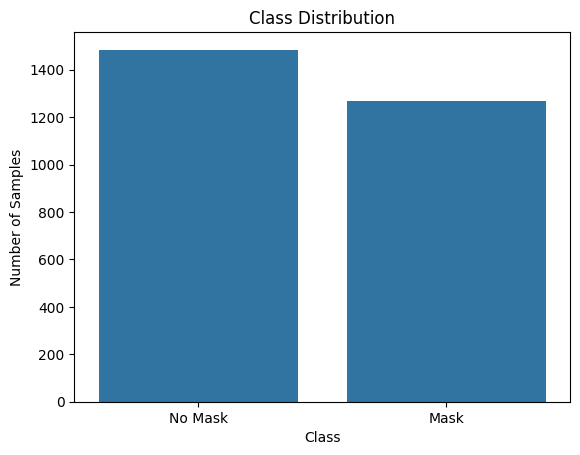

In [ ]:
import pandas as pd

# Tạo một DataFrame với các nhãn
labels = np.concatenate([mask_labels, no_mask_labels])
df = pd.DataFrame({'label': labels})

# Đếm số lượng mẫu của từng lớp
class_distribution = df['label'].value_counts()

# In ra số lượng mẫu của từng lớp
for label, count in class_distribution.items():
    class_name = 'Mask' if label == 1.0 else 'No Mask'
    print(f'Class {class_name}: {count} samples')

# Hiển thị phân phối lớp bằng biểu đồ cột
sns.barplot(x=class_distribution.index, y=class_distribution.values)
plt.xticks([0, 1], ['No Mask', 'Mask'])
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Class Distribution')
plt.show()


In [ ]:
# Concatenate the data and labels
X = np.concatenate((mask_images, no_mask_images), axis=0)
y = np.concatenate((mask_labels, no_mask_labels), axis=0)
filenames = mask_filenames + no_mask_filenames

# Split the data into training and testing sets
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(X, y, filenames, test_size=0.2, random_state=42)



# Training Model

### SVM_model

#### Grid search SVM

In [ ]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'gamma': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
    'kernel': ['rbf','linear','sigmoid','poly']
}

# Initialize the SVM classifier
svc = svm.SVC()

# Initialize GridSearchCV with the SVM classifier, parameter grid, and cross-validation strategy
grid_search = GridSearchCV(svc, param_grid,refit=True,verbose = 3, cv = 5)

In [ ]:
# Fit GridSearchCV on the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: ", grid_search.best_score_)



Fitting 10 folds for each of 252 candidates, totalling 2520 fits
[CV 1/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   4.9s
[CV 2/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   2.7s
[CV 3/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   2.4s
[CV 4/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   3.1s
[CV 5/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   1.7s
[CV 6/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   1.9s
[CV 7/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   1.8s
[CV 8/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   1.6s
[CV 9/10] END .C=0.001, gamma=1e-05, kernel=rbf;, score=0.545 total time=   1.5s
[CV 10/10] END C=0.001, gamma=1e-05, kernel=rbf;, score=0.541 total time=   1.4s
[CV 1/10] END C=0.001, gamma=1e-05, kernel=linear;, score=0.605 total time=   1.1s
[CV 2/10] END C=0.001, gamma=1e-05, kernel

#### Train lại SVM

In [ ]:
svm_model = SVC(kernel='rbf',C = 10, gamma = 'scale')
svm_model.fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_predictions)
print(f'SVM Accuracy: {svm_accuracy}')

SVM Accuracy: 0.9654545454545455


In [ ]:
y_pred = svm_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       285
           1       0.96      0.97      0.96       265

    accuracy                           0.97       550
   macro avg       0.97      0.97      0.97       550
weighted avg       0.97      0.97      0.97       550



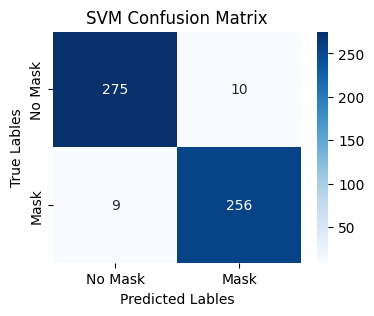

In [ ]:
svm_cm = confusion_matrix(y_test, svm_predictions)
plt.figure(figsize=(4, 3))
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Mask', 'Mask'], yticklabels=['No Mask', 'Mask'])
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted Lables')
plt.ylabel('True Lables')
plt.show()

## KNN_model

### knn grid

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Định nghĩa lưới tham số cho GridSearchCV
param_grid = {
    'n_neighbors': list(range(1, 100)),
    'weights': ['uniform', 'distance'],
}

# Khởi tạo KNN classifier
knn = KNeighborsClassifier()

# Khởi tạo GridSearchCV với verbose= để có thông tin chi tiết về tiến trình
grid_search_KNN = GridSearchCV(knn, param_grid, refit=True, verbose=3,cv= 5)

# Huấn luyện GridSearchCV trên dữ liệu huấn luyện
grid_search_KNN.fit(X_train, y_train)

# In ra các tham số tốt nhất và điểm số tương ứng
print("Best parameters found: ", grid_search_KNN.best_params_)
print("Best cross-validation score: ", grid_search_KNN.best_score_)

Fitting 5 folds for each of 198 candidates, totalling 990 fits
[CV 1/5] END ....n_neighbors=1, weights=uniform;, score=0.945 total time=   1.1s
[CV 2/5] END ....n_neighbors=1, weights=uniform;, score=0.916 total time=   1.2s
[CV 3/5] END ....n_neighbors=1, weights=uniform;, score=0.945 total time=   1.0s
[CV 4/5] END ....n_neighbors=1, weights=uniform;, score=0.952 total time=   1.2s
[CV 5/5] END ....n_neighbors=1, weights=uniform;, score=0.959 total time=   1.0s
[CV 1/5] END ...n_neighbors=1, weights=distance;, score=0.945 total time=   1.2s
[CV 2/5] END ...n_neighbors=1, weights=distance;, score=0.916 total time=   1.0s
[CV 3/5] END ...n_neighbors=1, weights=distance;, score=0.945 total time=   1.5s
[CV 4/5] END ...n_neighbors=1, weights=distance;, score=0.952 total time=   1.6s
[CV 5/5] END ...n_neighbors=1, weights=distance;, score=0.959 total time=   1.4s
[CV 1/5] END ....n_neighbors=2, weights=uniform;, score=0.893 total time=   1.1s
[CV 2/5] END ....n_neighbors=2, weights=unifor

### knn thêm tham số

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Định nghĩa lưới tham số cho GridSearchCV
param_grid = {
    'n_neighbors': list(range(1, 100)),
    'weights': ['uniform', 'distance'],
    'metric' : ['cosine', 'euclidean','manhattan', 'l1']
}

# Khởi tạo KNN classifier
knn = KNeighborsClassifier()

# Khởi tạo GridSearchCV với verbose= để có thông tin chi tiết về tiến trình
grid_search_KNN = GridSearchCV(knn, param_grid, refit=True, verbose=3,cv= 5)

# Huấn luyện GridSearchCV trên dữ liệu huấn luyện
grid_search_KNN.fit(X_train, y_train)

# In ra các tham số tốt nhất và điểm số tương ứng
print("Best parameters found: ", grid_search_KNN.best_params_)
print("Best cross-validation score: ", grid_search_KNN.best_score_)

Fitting 5 folds for each of 792 candidates, totalling 3960 fits
[CV 1/5] END metric=cosine, n_neighbors=1, weights=uniform;, score=0.952 total time=   0.2s
[CV 2/5] END metric=cosine, n_neighbors=1, weights=uniform;, score=0.941 total time=   0.2s
[CV 3/5] END metric=cosine, n_neighbors=1, weights=uniform;, score=0.952 total time=   0.1s
[CV 4/5] END metric=cosine, n_neighbors=1, weights=uniform;, score=0.925 total time=   0.1s
[CV 5/5] END metric=cosine, n_neighbors=1, weights=uniform;, score=0.961 total time=   0.1s
[CV 1/5] END metric=cosine, n_neighbors=1, weights=distance;, score=0.952 total time=   0.1s
[CV 2/5] END metric=cosine, n_neighbors=1, weights=distance;, score=0.941 total time=   0.1s
[CV 3/5] END metric=cosine, n_neighbors=1, weights=distance;, score=0.952 total time=   0.1s
[CV 4/5] END metric=cosine, n_neighbors=1, weights=distance;, score=0.925 total time=   0.1s
[CV 5/5] END metric=cosine, n_neighbors=1, weights=distance;, score=0.961 total time=   0.1s
[CV 1/5] EN

### train knn

In [ ]:
# Huấn luyện mô hình KNN
knn_model = KNeighborsClassifier(n_neighbors = 3, weights = 'distance', metric = 'manhattan')

knn_model.fit(X_train, y_train)

knn_predictions = knn_model.predict(X_test)
knn_accuracy = accuracy_score(y_test, knn_predictions)
print(f'KNN Accuracy: {knn_accuracy}')


KNN Accuracy: 0.9581818181818181


In [ ]:
print(classification_report(y_test,knn_predictions))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       285
           1       0.95      0.96      0.96       265

    accuracy                           0.96       550
   macro avg       0.96      0.96      0.96       550
weighted avg       0.96      0.96      0.96       550



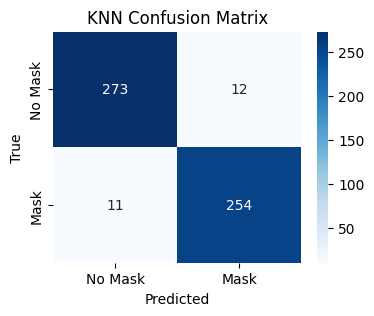

In [ ]:
knn_cm = confusion_matrix(y_test, knn_predictions)
plt.figure(figsize=(4, 3))
sns.heatmap(knn_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Mask', 'Mask'], yticklabels=['No Mask', 'Mask'])
plt.title('KNN Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Evaluate

### Chuyển img -> img_hog

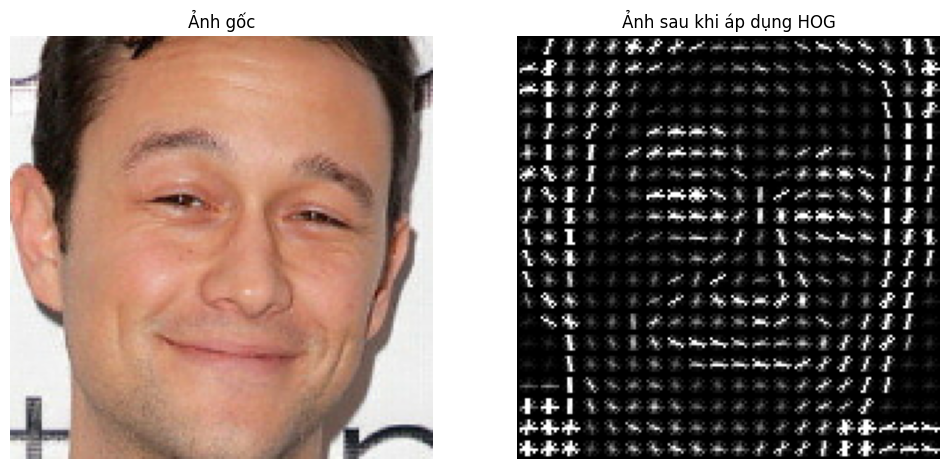

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

# Tải ảnh
image = cv2.imread('/content/drive/MyDrive/CS231_CV/TGMT/dataset/no_mask/no_mask/101.png')

# Chuyển thành grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Áp dụng HOG
features, hog_image = hog(gray_image,
                          orientations=9,
                          pixels_per_cell=(8, 8),
                          cells_per_block=(2, 2),
                          visualize=True,
                          channel_axis=None)  # Đảm bảo không có trục kênh màu

# Tăng cường độ sáng của ảnh HOG cho dễ nhìn
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

# Hiển thị ảnh gốc và ảnh HOG
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Hiển thị ảnh màu gốc
ax1.set_title('Ảnh gốc')

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Ảnh sau khi áp dụng HOG')

plt.show()

### Xuất ảnh (Img)

In [ ]:

def display_images(indices, case_name, y_predictions):
    max_images_per_row = 10
    image_size = (128, 128)
    num_images = len(indices)
    num_rows = (num_images // max_images_per_row) + int(num_images % max_images_per_row != 0)

    fig = plt.figure(figsize=(20, 10))
    fig.suptitle(case_name, fontsize=20)

    for i, idx in enumerate(indices):
        img_path = os.path.join(mask_images_folder if y_test[idx] == 1 else no_mask_images_folder, filenames_test[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, image_size)

        ax = fig.add_subplot(num_rows, max_images_per_row, i + 1)
        ax.imshow(img)
        ax.set_title(f'True: {y_test[idx]}, Pred: {y_predictions[idx]}', fontsize=12)
        ax.axis('off')

    plt.tight_layout()

    plt.show()


In [ ]:
def four_cases(y_predictions):
    # Identify the indices of the four cases
    case_indices = { "mask_incorrect": [], "no_mask_correct": []}

    for i, (true_label, pred_label) in enumerate(zip(y_test, y_predictions)):

        if true_label == 1 and pred_label == 0:
            case_indices["mask_incorrect"].append(i)
        elif true_label == 0 and pred_label == 1:
            case_indices["no_mask_correct"].append(i)

    # Display incorrectly predicted images
    display_images(case_indices["mask_incorrect"], "Mask Incorrect", y_predictions)
    display_images(case_indices["no_mask_correct"], "No Mask Correct", y_predictions)

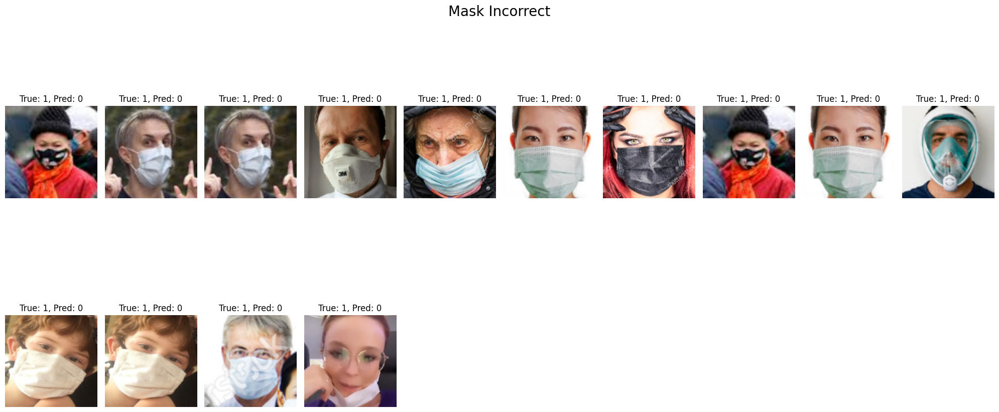

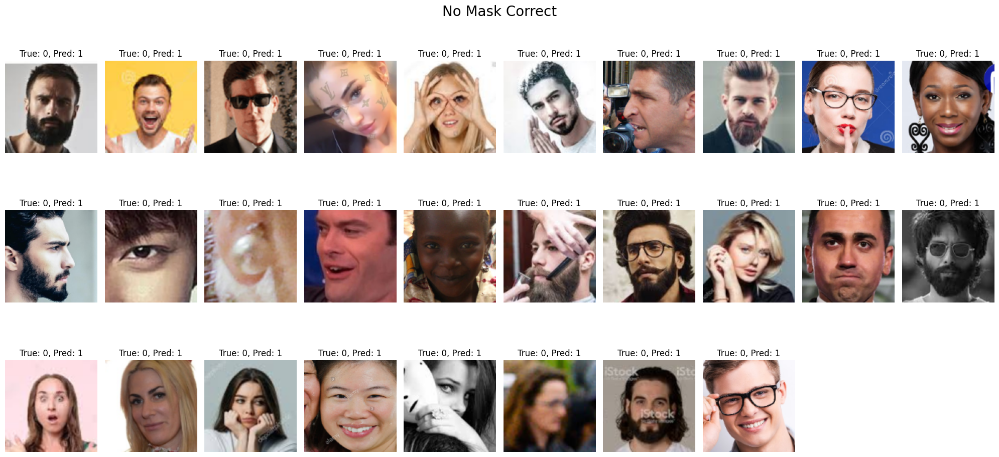

In [ ]:
four_cases(svm_predictions)

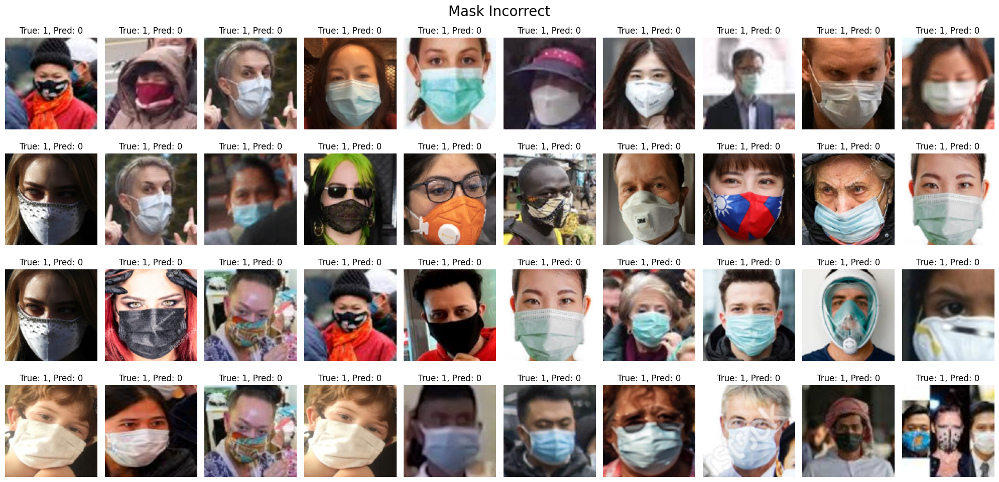

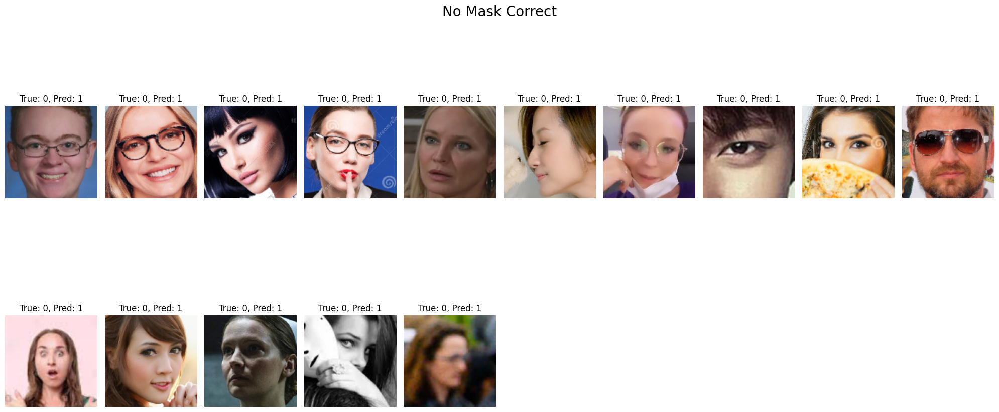

In [ ]:
four_cases(knn_predictions)

### Test 1 tập ảnh

#### Hàm process

In [ ]:
def preprocess_image(image_path, target_size):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Image not found or unable to load: {image_path}")
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    hog_features = extract_hog_features(image)

    return hog_features


folder = '/content/drive/MyDrive/CS231_CV/TGMT/dataset_demo/test'
filenames = os.listdir(folder)



#### svm

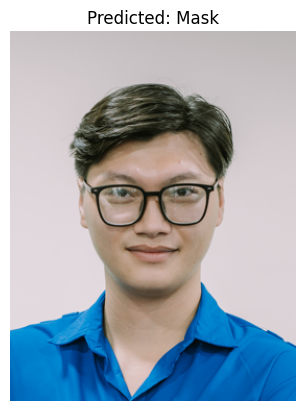

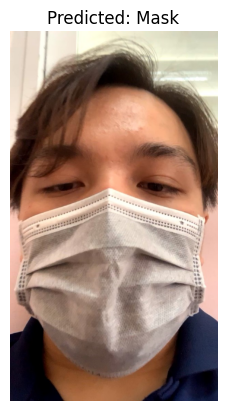

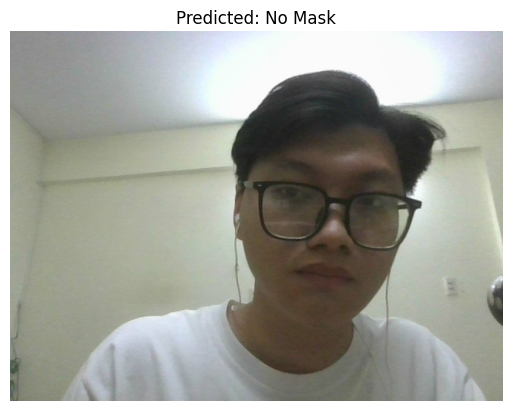

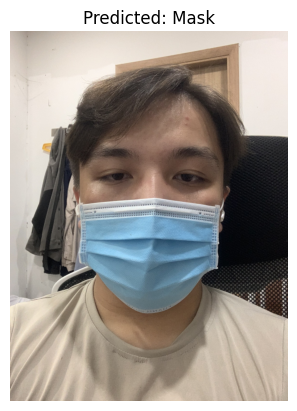

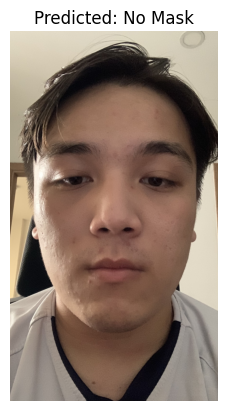

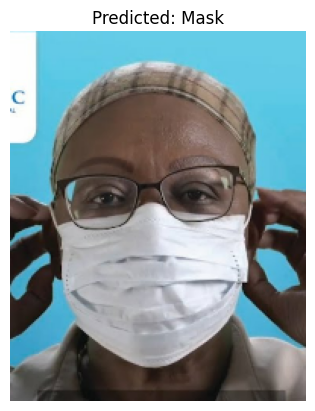

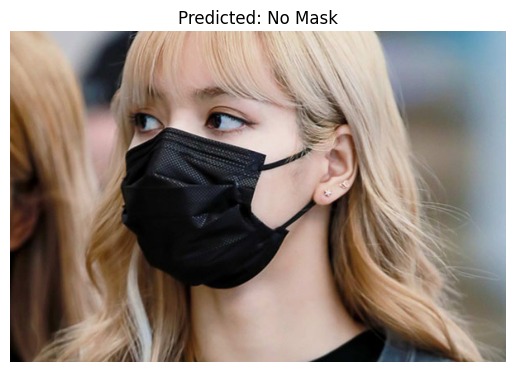

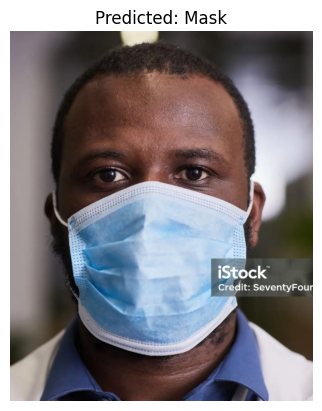

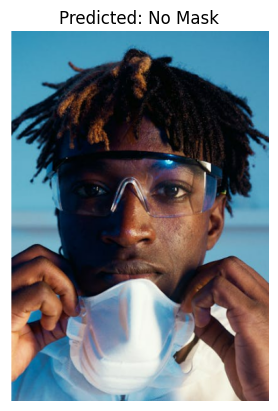

In [ ]:
for filename in filenames:
    image_path = os.path.join(folder, filename)

    # Tiền xử lý ảnh
    input_image = preprocess_image(image_path, (128, 128))

    # Thêm một chiều để phù hợp với định dạng đầu vào của mô hình (1, height, width, channels)
    input_image = np.expand_dims(input_image, axis=0)

    # Dự đoán nhãn cho ảnh đầu vào
    prediction = svm_model.predict(input_image)

    # Kết quả dự đoán
    predicted_label = prediction[0]

    # Hiển thị ảnh và kết quả dự đoán
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    plt.title(f'Predicted: {"Mask" if predicted_label == 1 else "No Mask"}')
    plt.axis('off')
    plt.show()


#### knn

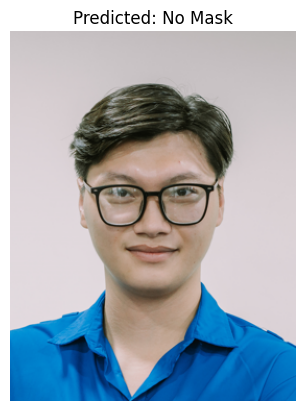

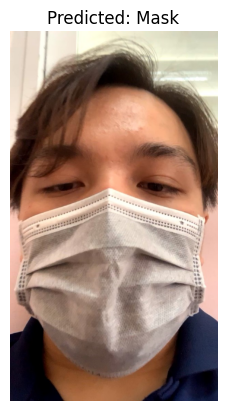

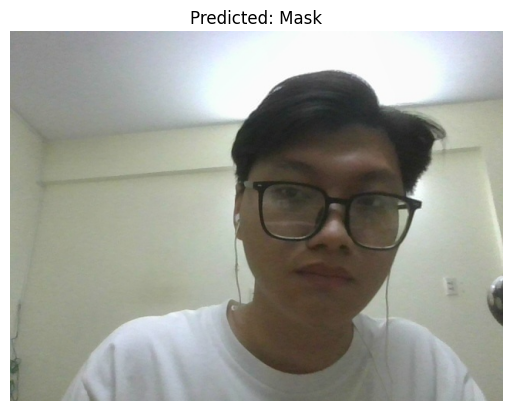

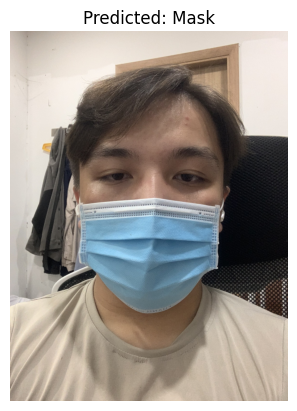

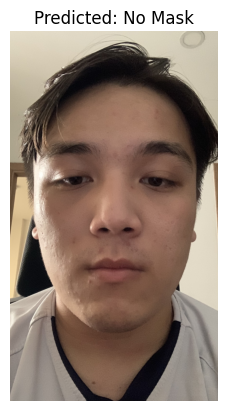

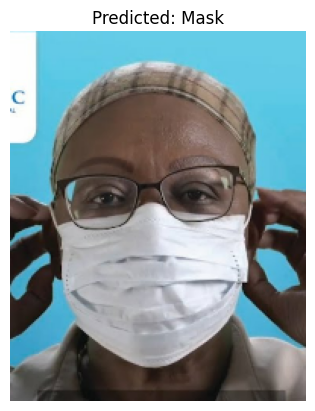

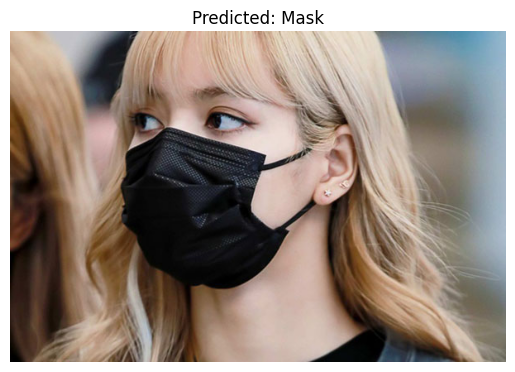

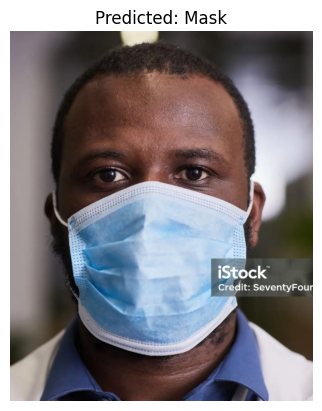

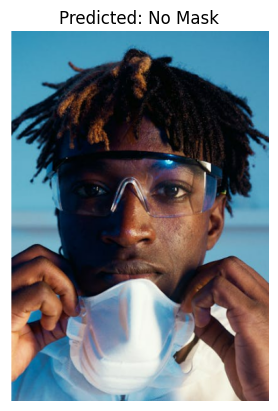

In [ ]:
for filename in filenames:
    image_path = os.path.join(folder, filename)

    # Tiền xử lý ảnh
    input_image = preprocess_image(image_path, (128, 128))

    # Thêm một chiều để phù hợp với định dạng đầu vào của mô hình (1, height, width, channels)
    input_image = np.expand_dims(input_image, axis=0)

    # Dự đoán nhãn cho ảnh đầu vào
    prediction = knn_model.predict(input_image)

    # Kết quả dự đoán
    predicted_label = prediction[0]

    # Hiển thị ảnh và kết quả dự đoán
    plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
    plt.title(f'Predicted: {"Mask" if predicted_label == 1 else "No Mask"}')
    plt.axis('off')
    plt.show()


### Test 1 ảnh bất kì

#### svm

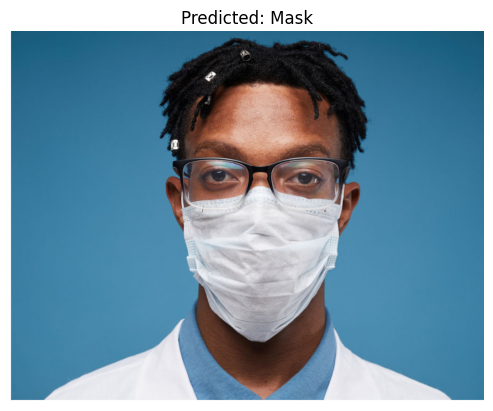

In [ ]:
def preprocess_image(image_path, target_size):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Image not found or unable to load: {image_path}")
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    hog_features = extract_hog_features(image)

    return hog_features

# Đường dẫn đến ảnh cần dự đoán
image_path = '/content/black_2.jpg'


# Tiền xử lý ảnh
input_image = preprocess_image(image_path, (64, 128))

# Thêm một chiều để phù hợp với định dạng đầu vào của mô hình (1, height, width, channels)
input_image = np.expand_dims(input_image, axis=0)

# Dự đoán nhãn cho ảnh đầu vào
prediction = svm_model.predict(input_image)

# Kết quả dự đoán
predicted_label = prediction[0]

# Hiển thị ảnh và kết quả dự đoán
plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
plt.title(f'Predicted: {"Mask" if predicted_label == 1 else "No Mask"}')
plt.axis('off')
plt.show()


#### Knn

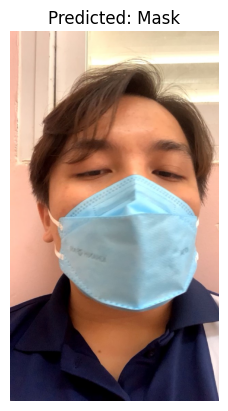

In [ ]:
def preprocess_image(image_path, target_size):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Image not found or unable to load: {image_path}")
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    hog_features = extract_hog_features(image)

    return hog_features

# Đường dẫn đến ảnh cần dự đoán
image_path = '/content/with_mask_type4_24.jpg'


# Tiền xử lý ảnh
input_image = preprocess_image(image_path, (64, 128))

# Thêm một chiều để phù hợp với định dạng đầu vào của mô hình (1, height, width, channels)
input_image = np.expand_dims(input_image, axis=0)

# Dự đoán nhãn cho ảnh đầu vào
prediction = knn_model.predict(input_image)

# Kết quả dự đoán
predicted_label = prediction[0]

# Hiển thị ảnh và kết quả dự đoán
plt.imshow(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
plt.title(f'Predicted: {"Mask" if predicted_label == 1 else "No Mask"}')
plt.axis('off')
plt.show()
